<img src="ml2_group_assignment.png" width="800"/>

# <font color=green> Introduction </font>

The assignment is focused on solving the Forest Cover Type Prediction: https://www.kaggle.com/c/forest-cover-type-prediction/overview. This task proposes a classification problem: predict the forest cover type (the predominant kind of tree cover) from strictly cartographic variables (as opposed to remotely sensed data).

The study area includes four wilderness areas located in the Roosevelt National Forest of northern Colorado. Each observation is a 30m x 30m patch. You are asked to predict an integer classification for the forest cover type. The seven types are:

1. Spruce/Fir
2. Lodgepole Pine
3. Ponderosa Pine
4. Cottonwood/Willow
5. Aspen
6. Douglas-fir
7. Krummholz

The training set (15120 observations) contains both features and the Cover_Type. The test set contains only the features. 

**You must predict the Cover_Type for every row in the test set (565892 observations).**

<img src="tree_types.png" width="800"/>

## How to work on the assignment

I expect 3 files from each group:
* **A file containing the best predictions from your best model (20%)**
* **A Jupyter notebook containing all the work the team did in order to deliver the best predictions (40%)**
* **A business report (40%)** explaining:
    * The goal
    * The work performed: include some detail about data cleaning, feature engineering and modelling
    * The results: meaningful metrics for the best models
    * Visualizations

No group presentation is expected for this assignment.

# <font color=green> Table of contents </font>

* Data Analysis
* Exploratory Data Analysis
* Feature Engineering & Selection
* Compare Several Machine Learning Models
* Perform Hyperparameter Tuning on the Best Model
* Interpret Model Results
* Evaluate the Best Model with Test Data (replying the initiating question)
* Summary & Conclusions

<img src="roosevelt-national-forest.jpeg" width=1200 height=800 align="center">

# <font color=green> Libaries used </font>

In [ ]:
!pip install squarify

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns  # Graphing
import matplotlib.pyplot as plt
import squarify #treemap

<a id='1'></a>
##  <font color=green>1.Import the Data </font>
Let’s load the training data and create data frame

In [2]:
data = pd.read_csv("train.csv")
data.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,...,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,...,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,...,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,...,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,...,0,0,0,0,0,0,0,0,0,5


keep the original dataset for latter comparisons and make a copy for the FE process

In [3]:
df = data.copy()

In [4]:
data.tail()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
15115,15116,2607,243,23,258,7,660,170,251,214,...,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,...,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,...,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,...,0,0,0,0,0,0,0,0,0,3
15119,15120,2475,197,34,319,78,270,189,244,164,...,0,0,0,0,0,0,0,0,0,3


In [5]:
data_test = pd.read_csv("test.csv")
data_test

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,15121,2680,354,14,0,0,2684,196,214,156,...,0,0,0,0,0,0,0,0,0,0
1,15122,2683,0,13,0,0,2654,201,216,152,...,0,0,0,0,0,0,0,0,0,0
2,15123,2713,16,15,0,0,2980,206,208,137,...,0,0,0,0,0,0,0,0,0,0
3,15124,2709,24,17,0,0,2950,208,201,125,...,0,0,0,0,0,0,0,0,0,0
4,15125,2706,29,19,0,0,2920,210,195,115,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565887,581008,2396,153,20,85,17,108,240,237,118,...,0,0,0,0,0,0,0,0,0,0
565888,581009,2391,152,19,67,12,95,240,237,119,...,0,0,0,0,0,0,0,0,0,0
565889,581010,2386,159,17,60,7,90,236,241,130,...,0,0,0,0,0,0,0,0,0,0
565890,581011,2384,170,15,60,5,90,230,245,143,...,0,0,0,0,0,0,0,0,0,0


In [6]:
data_test.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
count,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,...,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000,565892.000000
mean,298066.500000,2964.977407,155.629558,14.039635,270.556622,46.294408,2367.143116,212.131133,223.435026,142.726951,...,0.044768,0.091588,0.078704,0.002808,0.003161,0.000193,0.000467,0.026233,0.023236,0.014651
std,163359.093603,273.157030,111.962120,7.450155,212.500153,58.209469,1561.482002,26.661063,19.668053,38.030094,...,0.206795,0.288444,0.269277,0.052916,0.056137,0.013877,0.021594,0.159827,0.150652,0.120152
min,15121.000000,1859.000000,0.000000,0.000000,0.000000,-173.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,156593.750000,2818.000000,58.000000,9.000000,108.000000,7.000000,1116.000000,198.000000,213.000000,119.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,298066.500000,2999.000000,127.000000,13.000000,228.000000,29.000000,2018.000000,218.000000,226.000000,143.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,439539.250000,3164.000000,260.000000,18.000000,390.000000,69.000000,3349.000000,231.000000,237.000000,168.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,581012.000000,3858.000000,360.000000,66.000000,1397.000000,601.000000,7117.000000,254.000000,254.000000,254.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Just comparing the train and test with describe to have a first glimpse at the dataset

Notice only the train dataset has the attribute Cover_type, our target in classification, the test does not have this

<a id='2'></a>
# <font color=green>2. Data analysis</font>
To understand dataframe, let’s look at the data types, the data shape and descriptive statistics.
All features are integers. 

<a id='2.1'></a>
## <font color=green>__2.1.Explanation of variables__</font><br>
__Elevation__ / quantitative /meters / Elevation in meters <br>
__Aspect__ / quantitative / azimuth / Aspect in degrees azimuth <br>
__Slope__ / quantitative / degrees / Slope in degrees <br>
__Horizontal_Distance_To_Hydrology__ / quantitative / meters / Horz Dist to nearest surface water features <br>
__Vertical_Distance_To_Hydrology__ / quantitative / meters / Vert Dist to nearest surface water features <br>
__Horizontal_Distance_To_Roadways__ / quantitative / meters / Horz Dist to nearest roadway <br>
__Hillshade_9am__ / quantitative / 0 to 255 index / Hillshade index at 9am, summer solstice <br>
__Hillshade_Noon__ / quantitative / 0 to 255 index / Hillshade index at noon, summer soltice <br>
__Hillshade_3pm__ / quantitative / 0 to 255 index / Hillshade index at 3pm, summer solstice <br>
__Horizontal_Distance_To_Fire_Points__ / quantitative / meters / Horz Dist to nearest wildfire ignition points <br>
__Wilderness_Area (4 binary columns)__ / qualitative / 0 (absence) or 1 (presence) / Wilderness area designation <br>
__Soil_Type (40 binary columns)__ / qualitative / 0 (absence) or 1 (presence) / Soil Type designation <br>
__Cover_Type (7 types)__ / integer / 1 to 7 / Forest Cover Type designation <br>


The wilderness areas are:

1 - Rawah Wilderness Area <br>
2 - Neota Wilderness Area  <br>
3 - Comanche Peak Wilderness Area<br>
4 - Cache la Poudre Wilderness Area<br>

<img src="satellite1.png" width=1600 height=400 align="center">

<img src="satellite3.png" width=1600 height=400 align="center">

Source: Google My Maps, own made map based on wilderness area

<img src="satellite2.png" width=1600 height=800 align="center">


Estimated distance between areas to the centre of each. There is an approximate 25 km distance between nearest areas

The soil types are:<br>

1 Cathedral family - Rock outcrop complex, extremely stony.<br>
2 Vanet - Ratake families complex, very stony.<br>
3 Haploborolis - Rock outcrop complex, rubbly.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>
7 Gothic family.<br>
8 Supervisor - Limber families complex.<br>
9 Troutville family, very stony.<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
12 Legault family - Rock land complex, stony.<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
16 Cryaquolis - Cryoborolis complex.<br>
17 Gateview family - Cryaquolis complex.<br>
18 Rogert family, very stony.<br>
19 Typic Cryaquolis - Borohemists complex.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
26 Granile - Catamount families complex, very stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>
Source: https://www.kaggle.com/competitions/forest-cover-type-prediction/data


<img src="satellite.png" width=1600 height=800 align="center">

Example of Moran soil mapping, source:https://casoilresource.lawr.ucdavis.edu/sde/?series=moran#extent

In [7]:
data.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

We have 56 features with the test set consist of 15120 rows. 

In [8]:
data.shape

(15120, 56)

We have 56 columns: the target variable Cover Tyoe and 55 more features to work with. Let's analyze a little bit more each of them to check if we need to clean or preprocess them.

In [9]:
data.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

Vertical_Distance_To_Hydrology seems to have positive and negative values. Checking the negative values we observed that few are lying on an average altitude of Denver, which is 1500 metres, these values are likely patches bellow a water deposit in the mountain?

In [10]:
data.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.00000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,7560.50000,2749.322553,156.676653,16.501587,227.195701,51.076521,1714.023214,212.704299,218.965608,135.091997,...,0.045635,0.040741,0.001455,0.006746,0.000661,0.002249,0.048148,0.043452,0.030357,4.000000
std,4364.91237,417.678187,110.085801,8.453927,210.075296,61.239406,1325.066358,30.561287,22.801966,45.895189,...,0.208699,0.197696,0.038118,0.081859,0.025710,0.047368,0.214086,0.203880,0.171574,2.000066
min,1.00000,1863.000000,0.000000,0.000000,0.000000,-146.000000,0.000000,0.000000,99.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,3780.75000,2376.000000,65.000000,10.000000,67.000000,5.000000,764.000000,196.000000,207.000000,106.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,7560.50000,2752.000000,126.000000,15.000000,180.000000,32.000000,1316.000000,220.000000,223.000000,138.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,11340.25000,3104.000000,261.000000,22.000000,330.000000,79.000000,2270.000000,235.000000,235.000000,167.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,15120.00000,3849.000000,360.000000,52.000000,1343.000000,554.000000,6890.000000,254.000000,254.000000,248.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


<a id='3'></a>
# <font color=green> 3. Exploratory Data Analysis<font> 
### <font color=green> Analysis of the dataset <font> 

The pandas profiling gives us the information that the data is formatted and clean: There are no null values and all features are numeric. We have 12 numeric values and 44 Categorial values. 
The soil and wilderness area are already one-hot-encoded columns.<br>
The alert show us that Soiltype 7 and soiltype 15 are always zero. And there are several highly correlated features as well. 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

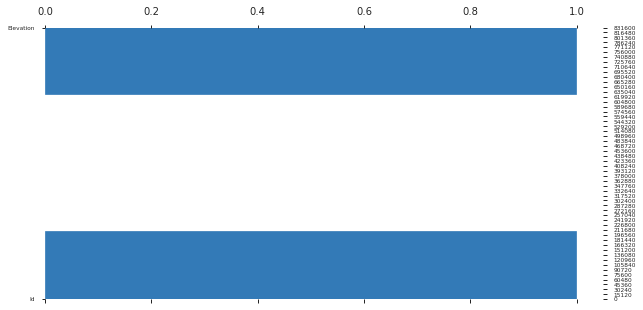

In [11]:
from pandas_profiling import ProfileReport
report = ProfileReport(data, minimal=False)
report

* __ID__: As unique values, consider dropping it from the analysis.<br>
* __Elevation__: Has very few values above 3500meters, which makes sense as the higher the altitude the less tree grow there.<br>
* __Aspect__: Has high correlation with the Hillshade variables<br>
* __Slope__: Has high correlation with the Hillshade variables, there seem to be values outside the norm around 25degrees<br>
* __Cover_Type__: Cover Type are equal distributed, each Cover Type are represented in an equally.<br>
* __Soil_Type15__ and __Soil_Type7__: No values, consider removing them but first check if these are also exist in the testing data to confirm our thought. <br>
* __Soil_Type28,36,25,9 and 8__: Very few values, seems to be rather scare soil types. <br>

Checking if the Soil_Type 15 and Soil_Type7 should be removed based on the test data. Since both do exist with values in the test set, we cannot test these as these do not exist in the test set. 

In [ ]:
data_test = pd.read_csv("test.csv")

In [ ]:
data_test['Soil_Type15'].value_counts()

In [ ]:
data_test['Soil_Type7'].value_counts()

The numerical variables seem to not be normal distributed. All variables though are not normal distributed, which will be tested with the statistical Shapiro test below. All features are more skewed.   The features that measure distance are positively skewed. Hillshade 9 am and Noon has a similar left-skewed distribution. None of the features follow a normal distribution, which is confirmed by the statistical Shapiro test for normality.

### <font color=green> D'Agostino and Pearson's Test <font> 
The numerical variables seem to not be normal distributed in the Pandas Profiling Report. However we will test this with the Shapiro test below and it confirms the initial analysis that the features do not follow a Gaussian Distribution at a significance level of 95%. All features are skewed. 

In [ ]:
# D'Agostino and Pearson's Test
from scipy.stats import normaltest
alpha = 0.05
for i in (['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology','Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']):
    print ()
    print (i)
    stat, p = normaltest(data[[i]])
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    if p > alpha:
        print('The data follows Gaussian Distribution (fail to reject H0)')
    else:
        print('The data does not follow Gaussian Distribution  (reject H0)')

### <font color=green>Variable Completness <font> 

Check for completness of data of Wilderness. Since Wilderness is One Hot Encoded, we want to check if all the values sum up to 15120 or if we have values which are entered as zero or even 1, meaning the values are entered twice in two different Wilderness. The below show that the values are all together sum up t0 15120, which shows us the completness of the Wilderness area and uniquiness of the wilderness area. 

In [ ]:
data.iloc[:,11:15].sum(axis=1).sum()

Same for the Soil, we check if the data is adding up to 15120 to see if there are values entered as zero and actually give us missing information. SAme for the Soil Data, the data is complete and there are no entered values with zero. 

In [ ]:
data.iloc[:,15:55].sum(axis=1).sum()

### Correlation Matrix
Looking at the features which are highly correlated with a threshold above 0.5: <br>
* __Vertical_Distance_To_Hydrology__ positivly correlated to __Horizontal_Distance_To_Hydrology__ <br>
* __Horizontal_Distance_To_Roadways__ positivly correlated to __Elevation__  <br>
* __Hillshade_9am__ negativly correlated and __Hillshade_3pm__ positivly correlated to __Aspect__<br>
* __Hillshade_Noon__ negativly correlated to __Slope__<br>
* __Hillshade variables__ are also correlated between themselves,but Hillshade 3pm and Hillshade 9am are negative correlated <br>
* __Wilderness Area 4__ is highly correlated with Elevation <br>

In [ ]:
#Heatmap 
matrix = data.corr()
mask = np.zeros_like(matrix)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(120,60))
heatmap = sns.heatmap(matrix, center=0, fmt=".2f", square=True, annot=True, linewidth=.9, mask = mask,vmax=.7);
plt.show()

In [ ]:
# Performing reverse One Hot Encoding using Pandas idxmax ( variables used for EDA and Data analysis only)
data['Wildness'] = (data.iloc[:, 11:15] == 1).idxmax(1)
data['Soil'] = (data.iloc[:, 15:56] == 1).idxmax(1)

In [ ]:
data['Cover_Type1'] = data['Cover_Type'].replace([1,2,3,4,5,6,7],['Spruce/Fir','Lodgepole Pine','Ponderosa Pine','Cottonwood/Willow','Aspen','Douglas-fir','Krummholz'])
data

### Paired density and scatterplot matrix

In the seaborn you can very well see that <br>
* Elevation differentiate the cover types very well 
* Slope, almost all Cover Types overlap 
* very skewed distribtutions of Horizontal/Vertical Distance to Hydrology, Horizontal Distance to Roadways and firepoints 

In [ ]:
import seaborn as sns
sns.set_theme(style="white")

g = sns.PairGrid(data, vars = ['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology','Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points'],hue='Cover_Type1', diag_sharey=False, palette = 'rainbow_r')
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot,warn_singular=False)
g.map_diag(sns.kdeplot, lw=2,warn_singular=False)
g.add_legend()

In [ ]:
sns.set_theme(style="white")

g = sns.PairGrid(data, vars = ['Hillshade_9am','Hillshade_Noon','Hillshade_3pm'],hue='Cover_Type1', diag_sharey=False, palette = 'rainbow_r')
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot,warn_singular=False)
g.map_diag(sns.kdeplot, lw=2,warn_singular=False)
g.add_legend()

Checking the values in the test set #COMMENTED

Hillshade 3pm  have some null values and looking at the graphical distribution it seems more these are missing values as these do not follow the pattern of the graph. But looking at the Hilshade noon and hilshade 9am it looks more these are not null in their case. Since Hilshade 9am and Hilshade 3pm are negativly correlated, we can impute the values based on the correlation. 

In [ ]:
!pip install plotly

In [ ]:
import plotly.express as px

In [ ]:
label_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 'Cottonwood/Willow', 'Aspen', 'Douglas-fir', 'Krummholz']
temp_df = data[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].copy()
temp_df['Cover_Type'] = [label_names[i-1] for i in data['Cover_Type']]

fig = px.scatter_3d(
    temp_df, 
    x='Hillshade_9am', 
    y='Hillshade_Noon', 
    z='Hillshade_3pm',
    color='Cover_Type',
    title='Hillshade Features in 3-D',
    opacity=0.2, 
    color_discrete_sequence=px.colors.qualitative.Plotly[:7],
    width=1000, height=800
    )

fig.show()

In [ ]:
label_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 'Cottonwood/Willow', 'Aspen', 'Douglas-fir', 'Krummholz']
temp_df = data[['Slope', 'Elevation', 'Aspect']].copy()
temp_df['Cover_Type'] = [label_names[i-1] for i in data['Cover_Type']]

fig = px.scatter_3d(
    temp_df, 
    x='Slope', 
    y='Elevation', 
    z='Aspect',
    color='Cover_Type',
    title='Hillshade Features in 3-D',
    opacity=0.2, 
    color_discrete_sequence=px.colors.qualitative.Plotly[:7],
    width=1000, height=800
    )

fig.show()

In [ ]:
label_names = ['Spruce/Fir', 'Lodgepole Pine', 'Ponderosa Pine', 'Cottonwood/Willow', 'Aspen', 'Douglas-fir', 'Krummholz']
temp_df = data[['Horizontal_Distance_To_Roadways', 'Horizontal_Distance_To_Fire_Points', 'Horizontal_Distance_To_Hydrology']].copy()
temp_df['Cover_Type'] = [label_names[i-1] for i in data['Cover_Type']]

fig = px.scatter_3d(
    temp_df, 
    x='Horizontal_Distance_To_Roadways', 
    y='Horizontal_Distance_To_Fire_Points', 
    z='Horizontal_Distance_To_Hydrology',
    color='Cover_Type',
    title='Hillshade Features in 3-D',
    opacity=0.2, 
    color_discrete_sequence=px.colors.qualitative.Plotly[:7],
    width=1000, height=800
    )

fig.show()

<a id='2.1'></a>
## <font color=green>__2.?.Categorial EDA__</font><br>

 __Area1__ has four dominant Cover types: Mainly Lodgepole Pine, Spruce/Fir, Aspen and bit Krummholz. <br>
 __Area2__ has three Cover Types but are small in numbers: Krummholz, Spruce/Fir and Lodgepole Pine. <br>
 __Area3__ has six Cover Types in decreasing order Krummholz, Aspen, Douglas-fir, Lodgepole Pine, Spruce/Fir and Ponderosa Pine.<br>
 __Area4__ has four dominant Cover types in decreasing order: Cottonwood/Willow, Ponderosa Pine, Douglas-fir and Lodgepole Pine. 

In [ ]:
sns.catplot(y="Wildness", hue='Cover_Type1', kind="count",
            palette='rainbow_r', edgecolor=".6",
            data=data)

Highlights only: 
There are few Soil Types where there are few Cover Types or not existing cover Types, most of them are stony soil types like Soil Types 18,24,5,9,28,34,37,36,26,27 and 25. Few are from other soil types like 16,20,19,8 and 21. <br>
__Soil_Type3__ (Haploborolis - Rock outcrop complex, rubbly) : Mainly Cover Type __Cottonwood__ <br>
__Soil_Type4__ (Ratake family - Rock outcrop complex, rubbly) :__Ponderosa Pine__ <br>
__Soil_Type10__ (Bullwark - Catamount families - Rock outcrop complex, rubbly): Mainly __Douglas-fir and Ponderosa Pine__ <br>
__Soil_Type23__ (Leighcan family, till substratum - Typic Cryaquolls complex): Mainly __Spruce/Fir__<br>
__Soil_Type29__ (Como - Legault families complex, extremely stony) : __Lodgepole Pine, Spruce/Fir__<br>
__Soil_Type30__ (Como family - Rock land - Legault family complex, extremely stony): __Aspen__<br>
__Soil_Type38__ (Leighcan - Moran families - Cryaquolls complex, extremely stony): Mainly __Krummholz__<br>
__Soil_Type39__ (Moran family - Cryorthents - Leighcan family complex, extremely stony): Mainly __Krummholz__<br>
__Soil_Type40__ (Moran family - Cryorthents - Rock land complex, extremely stony): Mainly __Krummholz__

In [ ]:
sns.catplot(y="Soil", hue='Cover_Type1', kind="count",
            palette='rainbow_r', edgecolor=".6",
            data=data,height=30, aspect=0.2)

### <font color=green>Violinplot with Dependent Variable </font><br>

Violinplot shows the distribution of the Cover_Types against the numerical variables: 

1. __Spruce/Fir__: Slope is lower <br>
2. __Lodgepole Pine__: Slope is lower <br>
3. __Ponderosa Pine__: closer to the road than other cover types<br>
4. __Cottonwood/Willow__:closer to the road than other cover types, found on lower elevation, lowest horizontal distance to hydrology is lower and less spread than the other coverTypes, vertical distance to hydrology is more above the sea level than below, Hildshade 9am is high<br>
5. __Aspen__: Hildshade 9am is high <br>
6. __Douglas-fir__: closer to the road than other cover types, Hildshade 9am is very spread<br>
7. __Krummholz__: found on higher elevation, Slope is lower <br>

* Elevation has the highest variance among the different Cover_Types
* Aspect on the other hand is fairly equally spread among the different Cover_Types 

In [ ]:
vars= ['Elevation','Aspect','Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology']
fig, axs = plt.subplots(1, len(vars), figsize=(25,5))
for i in range(0,len(vars)):
    sns.violinplot( y=data[vars[i]],x=data['Cover_Type1'], data=data,ax=axs[i],palette = 'rainbow_r')
    for tick in axs[i].get_xticklabels():
        tick.set_rotation(90)

In [ ]:
vars= ['Horizontal_Distance_To_Roadways','Hillshade_9am','Hillshade_Noon','Hillshade_3pm','Horizontal_Distance_To_Fire_Points']
fig, axs = plt.subplots(1, len(vars)-1, figsize=(25,5))
for i in range(0,len(vars)-1):
    sns.violinplot( y=data[vars[i]],x=data['Cover_Type1'], data=data,ax=axs[i],palette = 'rainbow_r')
    for tick in axs[i].get_xticklabels():
        tick.set_rotation(90)

<a id='2.1'></a>
### <font color=green>Treemap for categorial Data </font><br>
In order to see the distribution of the treemap features we are checking which features are more represented than others.<br>
You can see on the Soil Type that Soil Type 10 is represented the most, than Soil Type 29 and then Soil Type 3. 

In [ ]:
# Prepare Data
df = data.groupby('Soil').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

For the Wilderness Area: Wilderness Area 3 is highly represented (42%), then Area 4 (31%) , Area 1 (24%) and Area 2 (3%). 

In [ ]:
# Prepare Data
df = data.groupby('Wildness').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

As already seen in the Pandas Profiling Report Cover Type is equally distributed. 

In [ ]:
# Prepare Data
df = data.groupby('Cover_Type').size().reset_index(name='counts')
labels = df.apply(lambda x: str(x[0]) + "\n (" + str(x[1]) + ")", axis=1)
sizes = df['counts'].values.tolist()
colors = [plt.cm.Spectral(i/float(len(labels))) for i in range(len(labels))]

# Draw Plot
plt.figure(figsize=(30,20), dpi= 80)
squarify.plot(sizes=sizes, label=labels, color=colors, alpha=.8,text_kwargs={'fontsize':13})

# Decorate
plt.title('Treemap Native Country - Train ')
plt.axis('off')
plt.show()

<a id='4'></a>
# <font color=green> 4.First benchmark, baseline dataset <font>

### Basic benchmark without deploying any feature engineering. 

### Stock dataset without any modifications is used

## Random Forest

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

### Assign y and drop irrelevant features for x

In [30]:
X=data.drop(labels=['Id','Cover_Type'],axis=1)
y=data['Cover_Type']

### Do an additional split on the train dataset (data)

### Let's agree on a seed number for all!!! --> 18

In [31]:
X_train,X_val,y_train,y_val = train_test_split (X,y,random_state=18) #seed is 18!

### Fit model on the subsplit train

In [15]:
forest=RandomForestClassifier(n_estimators=20)
forest.fit(X_train,y_train)

RandomForestClassifier(n_estimators=20)

### Baseline score with random forest 20 on original dataframe

In [16]:
forest.score(X_val,y_val)

0.8338624338624339

### Deploying model in test dataset (data_test)

In [17]:
pred=forest.predict(data_test.drop(labels=['Id'], axis=1))

In [18]:
submission=pd.DataFrame(data=pred,columns=['Cover_Type'])
submission

,Cover_Type
0,2
1,2
2,2
3,2
4,2
...,...
565887,3
565888,3
565889,3
565890,3


### Pinpoint ID to prediction in data_test

In [19]:
submission['Id']=data_test['Id']
submission

,Cover_Type,Id
0,2,15121
1,2,15122
2,2,15123
3,2,15124
4,2,15125
...,...,...
565887,3,581008
565888,3,581009
565889,3,581010
565890,3,581011


# Decision Trees

In [20]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

In [21]:
tree = DecisionTreeClassifier(random_state=18)
tree.fit(X_train, y_train)

DecisionTreeClassifier(random_state=18)

In [22]:
y_pred_tr = tree.predict(X_train)
y_pred_ts = tree.predict(X_val)

In [23]:
print("Training Results:\n")
print(classification_report(y_train, y_pred_tr))
print("\nTesting Results:\n")
print(classification_report(y_val, y_pred_ts))

Training Results:

              precision    recall  f1-score   support

           1       1.00      1.00      1.00      1598
           2       1.00      1.00      1.00      1606
           3       1.00      1.00      1.00      1617
           4       1.00      1.00      1.00      1635
           5       1.00      1.00      1.00      1621
           6       1.00      1.00      1.00      1612
           7       1.00      1.00      1.00      1651

    accuracy                           1.00     11340
   macro avg       1.00      1.00      1.00     11340
weighted avg       1.00      1.00      1.00     11340


Testing Results:

              precision    recall  f1-score   support

           1       0.69      0.65      0.67       562
           2       0.62      0.59      0.61       554
           3       0.75      0.74      0.74       543
           4       0.92      0.91      0.91       525
           5       0.84      0.88      0.86       539
           6       0.75      0.77      0

In [24]:
from sklearn.model_selection import cross_val_score

### Baseline with decision trees (CV)

In [25]:
cv_score = cross_val_score(tree, X_train, y_train, cv=10, scoring='accuracy')
cv_score.mean()

0.7767195767195767

# KNN

In [26]:
from sklearn.neighbors import KNeighborsClassifier

In [27]:
knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=2)

In [28]:
print(knn.score(X_val,y_val))

0.8031746031746032


In [29]:
submission_knn = pd.DataFrame(data=pred,columns=['Cover_type'])
test_id = data_test['Id']
submission_knn['id'] = test_id
submission_knn.set_index('id',inplace=True)
submission_knn


,Cover_type
id,
15121,2
15122,2
15123,2
15124,2
15125,2
...,...
581008,3
581009,3
581010,3


<a id='3'></a>
# <font color=green> 3.Feature Engineering <font>

### <font color=green> Null Values <font>

In [ ]:
# Compute the median of the non-zero elements
m = np.median(data.Hillshade_3pm[data.Hillshade_3pm > 0])
# Assign the median to the zero elements 
data.Hillshade_3pm[data.Hillshade_3pm == 0] = m

In [ ]:
data.Hillshade_3pm.loc[data.Hillshade_3pm==0].count()

In [ ]:
data

In [ ]:
with seaborn.axes_style('white',{'grid.linewidth': .5,
                                'axes.facecolor': '.9'}): 
    HS_frame = data[['Hillshade_9am', 'Hillshade_Noon','Hillshade_3pm']]
    scatter_matrix(HS_frame, alpha=0.8, figsize=(12, 12), diagonal="kde") 
plt.show()

## <font color=green> Feature engineering of the features <font>
#### <font color=green> Drop ID as it has unique value <font> 

In [ ]:
data.drop('Id',axis = 1, inplace = True)

#### <font color=green> Distance To Hydrology <font> 

We combine Vertical distance to Hydrology and Horizontal distance to Hydrology since these two are highly correlated and also we can transform it into one variable which would give the distance to the closest water surface and using Pythagoras 
theorem for Distance calculation, since we have the horizontal and the vertical Distance. 
Source : https://towardsdatascience.com/types-of-transformations-for-better-normal-distribution-61c22668d3b9

In [ ]:
data['Distance_To_Hydrology'] = data['Horizontal_Distance_To_Hydrology']**2 +data['Vertical_Distance_To_Hydrology']**2
data['Distance_To_Hydrology'] = data['Distance_To_Hydrology']**0.5
data

Now we are checking the distribution of the new created variable if further transformation is needed. The Distance to Hydrology is still positive skewed and has zero values. In order to use log we will use log + 1 in oder to use logarithm with zero values. 

In [ ]:
print("Skew\n", data['Distance_To_Hydrology'].skew(), 
      "\nmin\n", data['Distance_To_Hydrology'].min(),
      "\nmax\n", data['Distance_To_Hydrology'].max(),)

In [ ]:
from scipy.stats import norm
import scipy.stats as stats

fig = plt.figure(figsize=(14,9))

sns.distplot(data['Distance_To_Hydrology'], hist = True, fit = norm, color='green',kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['log10_Distance_To_Hydrology'] = np.log10(data['Distance_To_Hydrology']+1)

In [ ]:
data['sqr_Distance_To_Hydrology'] = data['Distance_To_Hydrology']**0.5

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['log10_Distance_To_Hydrology'], hist = True, fit = norm,color = 'orange', kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
print("Skew\n", data['log10_Distance_To_Hydrology'].skew(), 
      "\nmin\n", data['log10_Distance_To_Hydrology'].min(),
      "\nmax\n", data['log10_Distance_To_Hydrology'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['sqr_Distance_To_Hydrology'], hist = True, color= 'darkgreen', fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
print("Skew\n", data['sqr_Distance_To_Hydrology'].skew(), 
      "\nmin\n", data['sqr_Distance_To_Hydrology'].min(),
      "\nmax\n", data['sqr_Distance_To_Hydrology'].max(),)

As you can see above, for distance to Hydrology the square root showed a better performance in terms of skewness and is closer to a normal bell shaped than the logarithm transformation. 

#### <font color=green> Horizontal Distance To Roadways <font> 

For log transformation there should be no zeros, negative values and the distribution should be positive skwed( bigger than 1 is positive) hence we are using the square root 

https://www.youtube.com/watch?v=_c3dVTRIK9c

In [ ]:
print("Skew\n", data['Horizontal_Distance_To_Roadways'].skew(), 
      "\nmin\n", data['Horizontal_Distance_To_Roadways'].min(),
      "\nmax\n", data['Horizontal_Distance_To_Roadways'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Horizontal_Distance_To_Roadways'], hist = True, fit = norm, color='green', kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['Sqr_Horizontal_Distance_To_Roadways'] = data['Horizontal_Distance_To_Roadways']**0.5
data['log_Horizontal_Distance_To_Roadways'] = np.log(data['Horizontal_Distance_To_Roadways']+1)
data['log10_Horizontal_Distance_To_Roadways'] = np.log10(data['Horizontal_Distance_To_Roadways']+1)

In [ ]:
print("Skew\n", data['Sqr_Horizontal_Distance_To_Roadways'].skew(), 
      "\nmin\n", data['Sqr_Horizontal_Distance_To_Roadways'].min(),
      "\nmax\n", data['Sqr_Horizontal_Distance_To_Roadways'].max(),)


In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Sqr_Horizontal_Distance_To_Roadways'], hist = True, color= 'darkgreen', fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
print("Skew\n", data['log_Horizontal_Distance_To_Roadways'].skew(), 
      "\nmin\n", data['log_Horizontal_Distance_To_Roadways'].min(),
      "\nmax\n", data['log_Horizontal_Distance_To_Roadways'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['log_Horizontal_Distance_To_Roadways'], hist = True,color = 'orange', fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['log_log_Horizontal_Distance_To_Roadways'] = np.log(data['log_Horizontal_Distance_To_Roadways']+1)

In [ ]:
print("Skew\n", data['log_log_Horizontal_Distance_To_Roadways'].skew(), 
      "\nmin\n", data['log_log_Horizontal_Distance_To_Roadways'].min(),
      "\nmax\n", data['log_log_Horizontal_Distance_To_Roadways'].max(),)

In [ ]:
print("Skew\n", data['log10_Horizontal_Distance_To_Roadways'].skew(), 
      "\nmin\n", data['log10_Horizontal_Distance_To_Roadways'].min(),
      "\nmax\n", data['log10_Horizontal_Distance_To_Roadways'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['log10_Horizontal_Distance_To_Roadways'], hist = True, color = 'orange',fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
normaltest(data['log10_Horizontal_Distance_To_Roadways'])

We achieved the best result for square root of the Horizontal Distance to Roadways 

#### <font color=green> Slope <font> 

In [ ]:
print("Skew before transformation\n", data['Slope'].skew(), 
      "\nmin\n", data['Slope'].min(),
      "\nmax\n", data['Slope'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Slope'], hist = True, fit = norm, kde = True,  color='green',kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['logSlope'] = np.log(data['Slope']+1)

In [ ]:
print("Skew after transformation\n", data['logSlope'].skew(), 
      "\nmin\n", data['logSlope'].min(),
      "\nmax\n", data['logSlope'].max(),)

In [ ]:
data['SqrSlope'] = data['Slope']**0.5

In [ ]:
print("Skew after transformation\n", data['SqrSlope'].skew(), 
      "\nmin\n", data['SqrSlope'].min(),
      "\nmax\n", data['SqrSlope'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['SqrSlope'], hist = True, fit = norm, kde = True,color= 'darkgreen', kde_kws = {'shade': True, 'linewidth': 3})

Since the skweness for the slope shows better performance when using the sqaure root, we will transform the variable into square root as well 

#### <font color=green> Horizontal_Distance_To_Fire_Points'<font> 

In [ ]:
print("Skew before transformation\n", data['Horizontal_Distance_To_Fire_Points'].skew(), 
      "\nmin\n", data['Horizontal_Distance_To_Fire_Points'].min(),
      "\nmax\n", data['Horizontal_Distance_To_Fire_Points'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Horizontal_Distance_To_Fire_Points'], hist = True,  color='green',fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['log_Horizontal_Distance_To_firepoints'] = np.log(data['Horizontal_Distance_To_Fire_Points']+1)

In [ ]:
print("Skew after log transformation\n", data['log_Horizontal_Distance_To_firepoints'].skew(), 
      "\nmin\n", data['log_Horizontal_Distance_To_firepoints'].min(),
      "\nmax\n", data['log_Horizontal_Distance_To_firepoints'].max(),)

In [ ]:
data['sqr_Horizontal_Distance_To_firepoints'] = data['Horizontal_Distance_To_Fire_Points']**0.5

In [ ]:
print("Skew after sqr transformation\n", data['sqr_Horizontal_Distance_To_firepoints'].skew(), 
      "\nmin\n", data['sqr_Horizontal_Distance_To_firepoints'].min(),
      "\nmax\n", data['sqr_Horizontal_Distance_To_firepoints'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['sqr_Horizontal_Distance_To_firepoints'], hist = True, color= 'darkgreen',fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

Since it is less skewed after sqr transformation, we will also use sqr for the feature variable

#### <font color=green> Hillshades<font> 

In [ ]:
data['Mean_Hillshade'] = (data['Hillshade_9am']+data['Hillshade_Noon']+data['Hillshade_3pm'])/3

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Mean_Hillshade'], hist = True, fit = norm,  color='green',kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
print("Skew before transformation\n", data['Mean_Hillshade'].skew(), 
      "\nmin\n", data['Mean_Hillshade'].min(),
      "\nmax\n", data['Mean_Hillshade'].max(),)

In [ ]:
data['log_Mean_Hillshade'] = np.log(data['Mean_Hillshade'])

In [ ]:
print("Skew before transformation\n", data['log_Mean_Hillshade'].skew(), 
      "\nmin\n", data['log_Mean_Hillshade'].min(),
      "\nmax\n", data['log_Mean_Hillshade'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['log_Mean_Hillshade'], hist = True, fit = norm, kde = True,color = 'orange', kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['log10Mean_Hillshade'] = np.log10(data['Mean_Hillshade'])

In [ ]:
print("Skew before transformation\n", data['log_log_Mean_Hillshade'].skew(), 
      "\nmin\n", data['log10Mean_Hillshade'].min(),
      "\nmax\n", data['log10Mean_Hillshade'].max(),)

In [ ]:
data['sqr_Mean_Hillshade'] = data['Mean_Hillshade']**0.5

In [ ]:
print("Skew before transformation\n", data['sqr_Mean_Hillshade'].skew(), 
      "\nmin\n", data['sqr_Mean_Hillshade'].min(),
      "\nmax\n", data['sqr_Mean_Hillshade'].max(),)

We will not use any transformation as the data does not improve. In the next step we will normalize it

#### <font color=green> Aspect <font> 

In [ ]:
print("Skew before transformation\n", data['Aspect'].skew(), 
      "\nmin\n", data['Aspect'].min(),
      "\nmax\n", data['Aspect'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['Aspect'], hist = True, color= 'darkgreen',fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['sqr_Aspect'] = data['Aspect']**0.5

In [ ]:
print("Skew before transformation\n", data['sqr_Aspect'].skew(), 
      "\nmin\n", data['sqr_Aspect'].min(),
      "\nmax\n", data['sqr_Aspect'].max(),)

In [ ]:
fig = plt.figure(figsize=(14,9))

sns.distplot(data['sqr_Aspect'], hist = True, color= 'darkgreen',fit = norm, kde = True, kde_kws = {'shade': True, 'linewidth': 3})

In [ ]:
data['log_Aspect'] = data['Aspect']**0.5

In [ ]:
data['log_Aspect'] = np.log(data['Aspect']+1)

In [ ]:
print("Skew before transformation\n", data['log_Aspect'].skew(), 
      "\nmin\n", data['log_Aspect'].min(),
      "\nmax\n", data['log_Aspect'].max(),)

In [ ]:
pip install htmltabletomd

In [ ]:
import htmltabletomd

## <font color=green> Summary<font> 

<table>
  <tr>
    <th><b>Features</b></th>
    <th><b>Transformation</b></th>
  </tr>
  <tr>
<td>ID  </td>
    <td> Drop</td>
  </tr>
  <tr>
    <td>Distance To Hydrology  </td>
    <td><b><i>Square Root</i></b> of the length of the side of horizontal and vertical </td>
  </tr>
  <tr>
    <td>Sqr_Horizontal_Distance_To_Roadways</td>
    <td><b>Square Root</b> of horizontal Distance to Roadways</td>
  </tr>
  <tr>
    <td>SqrSlope</td>
    <td><b><i>Square Root</i></b> Slope</td>
  </tr>
  <tr>
    <td>Sqr_Horizontal_Distance_To_firepoints</td>
    <td><b><i>Square Root</i></b> Horizontal Distance to firepoints</td>
  </tr>
  <tr>
    <td>Mean Hillshade</td>
    <td><b><i>Average</i></b> of all Hillshades features</td>
  <tr>      
  </tr>
</table>

### Advanced Factorization

The numerical values present a level of detail that may be much more fine-grained than we need. For instance, the soil level can be represented by different categories (soil family, complex or stony/rubberly). We aggregate the data up which can help to avoid overfitting when the data is more aggregate: 

Using Discretization to bin the soil variable to the family type.<br>

__Cathedral__ <br>
1 Cathedral family - Rock outcrop complex, extremely stony.<br>

__Ratake__ <br>
2 Vanet - Ratake families complex, very stony.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>

__Vanet__<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>

__Wetmore__<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>

__Gothic__<br>
7 Gothic family.<br>
                    
__Limber__ <br>
8 Supervisor - Limber families complex. <br>

__Troutville__<br>
9 Troutville family, very stony.<br>

__Legault__<br>
12 Legault family - Rock land complex, stony.<br>
29 Como - Legault families complex, extremely stony.<br>

__Gateview__ <br>
17 Gateview family - Cryaquolis complex.<br>

__Rogert__<br>
18 Rogert family, very stony.<br>


__Como__<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>

__Bross__<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>



__Catamount__<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>
26 Granile - Catamount families complex, very stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>

__Leighcan__<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>

__Moran__<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>

__Others__<br> 
3 Haploborolis - Rock outcrop complex, rubbly.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
16 Cryaquolis - Cryoborolis complex.<br>
19 Typic Cryaquolis - Borohemists complex.<br>

In [ ]:
# Soil Type
family_soil_types = {
    'Family_Cathedral': ['Soil_Type1'],
    'Family_Retake': ['Soil_Type2', 'Soil_Type4'],
    'Family_Vanet': ['Soil_Type5'],
    'Family_Wetmore': ['Soil_Type6'],
    'Family_Gothic': ['Soil_Type7'],
    'Family_Limber': ['Soil_Type8'],
    'Family_Troutville_': ['Soil_Type9'],
    'Family_Legault': ['Soil_Type12', 'Soil_Type29'],
    'Family_Gateview': ['Soil_Type17'],
    'Family_Rogert': ['Soil_Type18'],
    'Family_Como': ['Soil_Type30'],
    'Family_Bross': ['Soil_Type36'],
    'Family_Catamount': ['Soil_Type10','Soil_Type11','Soil_Type13','Soil_Type26','Soil_Type32','Soil_Type31','Soil_Type33'],
    'Family_Leighcan': ['Soil_Type21','Soil_Type22','Soil_Type23','Soil_Type24','Soil_Type25','Soil_Type27','Soil_Type28'],
    'Family_Moran': ['Soil_Type38','Soil_Type39','Soil_Type40'],
    'Family_Others': ['Soil_Type3','Soil_Type15','Soil_Type37','Soil_Type34','Soil_Type35','Soil_Type20','Soil_Type14','Soil_Type16','Soil_Type19'],
} 

for family in family_soil_types:
    data[family] = 0
    soil_types = family_soil_types[family]
    for soil_type in soil_types:
        data[family] += data[soil_type]

data

We will group the soil types according to their family and according to the complex and stonyness

Complex Group <br>
__Rock_outcrop_complex__ <br>
1 Cathedral family - Rock outcrop complex, extremely stony.<br>
2 Vanet - Ratake families complex, very stony.<br>
3 Haploborolis - Rock outcrop complex, rubbly.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>

__Ratake_families_complex__<br>
2 Vanet - Ratake families complex, very stony.<br>


__Limber families complex__<br>
8 Supervisor - Limber families complex.<br>

__rock land complex__<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
12 Legault family - Rock land complex, stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>

__Cryoborolis complex__<br>
16 Cryaquolis - Cryoborolis complex.<br>
17 Gateview family - Cryaquolis complex.<br>

__Bullwark family complex__<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>

__Aquolis complex__<br>
14 Pachic Argiborolis - Aquolis complex.<br>

__Borohemists complex__<br>
19 Typic Cryaquolis - Borohemists complex.<br>

__Cryaquolls complex__<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>

__till substratum complex__<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>

__Catamount families complex__<br>
26 Granile - Catamount families complex, very stony.<br>
1 Leighcan - Catamount families complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>

__Legault families complex__<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>

__Leighcan family complex__<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>

__Cryaquepts complex__<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>

__Cryumbrepts complex__<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>

__Cryorthents complex__<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>

__others__ <br>
7 Gothic family.<br>
9 Troutville family, very stony.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
18 Rogert family, very stony.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>


Source: https://www.kaggle.com/competitions/forest-cover-type-prediction/data

In [ ]:
# Complex Type
family_complex_types = {
    'Rock_outcrop_complex': ['Soil_Type1','Soil_Type2','Soil_Type3','Soil_Type4','Soil_Type5','Soil_Type6','Soil_Type10','Soil_Type27','Soil_Type28','Soil_Type33'],
    'Ratake_families_complex': ['Soil_Type2'],
    'Limber_families_complex': ['Soil_Type8'],
    'Rock_land_complex': ['Soil_Type11','Soil_Type12','Soil_Type34','Soil_Type40'],
    'Cryoborolis_complex': ['Soil_Type16','Soil_Type17'],
    'Bullwark_family_complex': ['Soil_Type13'],
    'Aquolis_complex_': ['Soil_Type14'],
    'Borohemists_complex': ['Soil_Type19'],
    'Cryaquolls_complex': ['Soil_Type20','Soil_Type23','Soil_Type38'],
    'Till_substratum_complex': ['Soil_Type21'],
    'Catamount_families_complex': ['Soil_Type26','Soil_Type1','Soil_Type31'],
    'Legault_families_complex': ['Soil_Type39','Soil_Type30'],
    'Leighcan_family_complex': ['Soil_Type32','Soil_Type39'],
    'Cryaquepts_complex': ['Soil_Type35'],
    'Cryumbrepts_complex': ['Soil_Type36'],
    'Cryorthents_complex': ['Soil_Type37'],
    'others_complex': ['Soil_Type7','Soil_Type9','Soil_Type22','Soil_Type24','Soil_Type25','Soil_Type18','Soil_Type15'],
} 

for family in family_complex_types:
    data[family] = 0
    complex_types = family_complex_types[family]
    for complex_type in complex_types:
        data[family] += data[complex_type]

data

__Stony__ <br>
1 Cathedral family - Rock outcrop complex, extremely stony.<br>
2 Vanet - Ratake families complex, very stony.<br>
6 Vanet - Wetmore families - Rock outcrop complex, stony.<br>
9 Troutville family, very stony.<br>
12 Legault family - Rock land complex, stony.<br>
18 Rogert family, very stony.<br>
24 Leighcan family, extremely stony.<br>
25 Leighcan family, warm, extremely stony.<br>
26 Granile - Catamount families complex, very stony.<br>
27 Leighcan family, warm - Rock outcrop complex, extremely stony.<br>
28 Leighcan family - Rock outcrop complex, extremely stony.<br>
29 Como - Legault families complex, extremely stony.<br>
30 Como family - Rock land - Legault family complex, extremely stony.<br>
31 Leighcan - Catamount families complex, extremely stony.<br>
32 Catamount family - Rock outcrop - Leighcan family complex, extremely stony.<br>
33 Leighcan - Catamount families - Rock outcrop complex, extremely stony.<br>
34 Cryorthents - Rock land complex, extremely stony.<br>
36 Bross family - Rock land - Cryumbrepts complex, extremely stony.<br>
37 Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.<br>
38 Leighcan - Moran families - Cryaquolls complex, extremely stony.<br>
39 Moran family - Cryorthents - Leighcan family complex, extremely stony.<br>
40 Moran family - Cryorthents - Rock land complex, extremely stony.<br>

__Rubbly__<br>
3 Haploborolis - Rock outcrop complex, rubbly.<br>
4 Ratake family - Rock outcrop complex, rubbly.<br>
5 Vanet family - Rock outcrop complex complex, rubbly.<br>
10 Bullwark - Catamount families - Rock outcrop complex, rubbly.<br>
11 Bullwark - Catamount families - Rock land complex, rubbly.<br>
13 Catamount family - Rock land - Bullwark family complex, rubbly.<br>

__others__<br>
7 Gothic family.<br>
8 Supervisor - Limber families complex.<br>
14 Pachic Argiborolis - Aquolis complex.<br>
15 unspecified in the USFS Soil and ELU Survey.<br>
16 Cryaquolis - Cryoborolis complex.<br>
17 Gateview family - Cryaquolis complex.<br>
19 Typic Cryaquolis - Borohemists complex.<br>
20 Typic Cryaquepts - Typic Cryaquolls complex.<br>
21 Typic Cryaquolls - Leighcan family, till substratum complex.<br>
22 Leighcan family, till substratum, extremely bouldery.<br>
23 Leighcan family, till substratum - Typic Cryaquolls complex.<br>
35 Cryumbrepts - Rock outcrop - Cryaquepts complex.<br>

In [ ]:
# Soil Type
family_types = {
    'Type_Stony': ['Soil_Type1','Soil_Type2', 'Soil_Type6', 'Soil_Type9', 'Soil_Type12', 'Soil_Type18', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'],
    'Type_Rubbly': ['Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type10', 'Soil_Type11', 'Soil_Type13'],
    'Type_Other': ['Soil_Type7','Soil_Type8', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type35']
} 

for family in family_types:
    data[family] = 0
    soil_types = family_types[family]
    for soil_type in soil_types:
        data[family] += data[soil_type]

data

### Standardization 

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 1)
print(X_train)

Select zero values of Hillshade 3pm

In [ ]:
df = data[data['Hillshade_3pm']==0]
print(df.shape)
df.sample(5)

In [ ]:
data1 = data.loc[data['Hillshade_3pm'] != 0]
print(data1.shape)
print(data.shape)

In [ ]:
data1 = data.drop(columns =['Wildness','Soil','Cover_Type1'])

In [ ]:
y_train = data1['Hillshade_3pm']
X_train = data1.drop('Hillshade_3pm', axis=1)
X_test = data1. drop('Hillshade_3pm', axis=1)

In [ ]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
lr.fit(X_train, y_train)

In [ ]:
y_pred = lr.predict(X_test)
data.loc[data['Hillshade_3pm']==0, 'Hillshade_3pm' ] = y_pred

Hillshade, create mean of all Hillshade variables

In [ ]:
data['Mean_Hilshade'] = (data['Hillshade_9am']+data['Hillshade_Noon']+data['Hillshade_3pm'])/3

In [ ]:
data['Mean_Hilshade'].hist()

#creating distance to hydrology as a function of horizontal and vertical 
forestdata$Euclidean_Distance_To_Hydrology = (forestdata$Horizontal_Distance_To_Hydrology^2 + forestdata$Vertical_Distance_To_Hydrology^2)^.5

### <font color=green> 3.1 Check for Anomalies and Outliers <font>

Since the z-score is sensitive to the  mean and standard deviation and its assumption of a normally distributed variable, we cannot use the z-score for outlier handleing. The disadvantage using percentile it consoders always and outlier of the lowest or highest value, even there are no outliers. As the number of observations increases, so does the number of observations considered outliers; After all, using a percentile based method will always flat-out reject a certain percentage of our observations.Thus, we are using the alternative method __Modified Z-score method__.

However, it also considers as an outlier the lowest value; This is a consequence of using percentile based methods  
Using standard deviation from the mean to check for outliers. The advantage of using standard deviation from the mean is it will not give us outliers for each features but the disadvantage is the mean is subject to skewed data. Thus, the analysis needs to be taken with care. Also use  use percentiles for completness and comparison of outliers. 

In [ ]:
import numpy as np
import pandas as pd

def detect_outlier(data_1):
    outliers=[]

    
    threshold=3
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    if std_1 == 0:
        return outliers
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y) 
    return outliers

The dummies variables should be taken with care as these are binary values and all the values if detected will be outliers.

In [ ]:
for column in data.columns:
    outlier_datapoints = detect_outlier(data[column])
    if len(outlier_datapoints) != 0:
        print(f'There are {len(outlier_datapoints)} outliers in {column}')

The IQR is the difference between the 75th and 25th percentile. The IQR is more resistant to outliers. The IQR by definition only covers the middle 50% of the data, so outliers are well outside this range and the presence of a small number of outliers is not likely to change this significantly. If you add an outlier, the IQR will change to another set of data points that are probably not that dissimilar to the previous ones (in most datasets), hence it is “resistant” to change. This is especially the case of a large dataset.

Now if you add some crazy extreme data point at the end, the 75th and 25th percentile doesn’t change much, because extreme outliers or no, 75% of the data still lies below roughly the same amount.

In [ ]:
# loop through all columns to see if there are any outliers
for i in data.columns:
    if outlier_function(data, i)[2] > 0:
        print("There are {} outliers in {}".format(outlier_function(data, i)[2], i))
        print(f'There are {outlier_function(data, i)[2]} outliers in {i}')

# Whatever